In [1]:
!ls

Dataset
Like_Unlike_Perceptron.ipynb
MP_Neuron.ipynb
Perceptron.ipynb
like_Unlike_MP_Neuron.ipynb
submission.csv


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder,MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, log_loss
import operator
import json
from IPython import display
import os
import warnings

np.random.seed(0)
warnings.filterwarnings("ignore")
THRESHOLD = 4


|Task: To predict whether the user likes the mobile phone or not.    
Assumption: If the average rating of mobile >= threshold, then the user likes it, otherwise not.

Missing values:
'Also Known As'(459),'Applications'(421),'Audio Features'(437),'Bezel-less display'(266),'Browser'(449),'Build Material'(338),'Co-Processor'(451),'Display Colour'(457),'Mobile High-Definition Link(MHL)'(472),'Music'(447) 'Email','Fingerprint Sensor Position'(174),'Games'(446),'HDMI'(454),'Heart Rate Monitor'(467),'IRIS Scanner'(467), 'Optical Image Stabilisation'(219),'Other Facilities'(444),'Phone Book'(444),'Physical Aperture'(87),'Quick Charging'(122),'Ring Tone'(444),'Ruggedness'(430),SAR Value(315),'SIM 3'(472),'SMS'(470)', 'Screen Protection'(229),'Screen to Body Ratio (claimed by the brand)'(428),'Sensor'(242),'Software Based Aperture'(473), 'Special Features'(459),'Standby time'(334),'Stylus'(473),'TalkTime'(259), 'USB Type-C'(374),'Video Player'(456), 'Video Recording Features'(458),'Waterproof'(398),'Wireless Charging','USB OTG Support'(159), 'Video ,'Recording'(113),'Java'(471),'Browser'(448)

Very low variance:
'Architecture'(most entries are 64-bit),'Audio Jack','GPS','Loudspeaker','Network','Network Support','Other Sensors'(28),'SIM Size', 'VoLTE'

Multivalued:
'Colours','Custom UI','Model'(1),'Other Sensors','Launch Date'

Not important:
'Bluetooth', 'Settings'(75),'Wi-Fi','Wi-Fi Features'

Doubtful:
'Aspect Ratio','Autofocus','Brand','Camera Features','Fingerprint Sensor'(very few entries are missing), 'Fingerprint Sensor Position', 'Graphics'(multivalued),'Image resolution'(multivalued),'SIM Size','Sim Slot(s)', 'User Available Storage', 'SIM 1', 'SIM 2','Shooting Modes', 'Touch Screen'(24), 'USB Connectivity'

To check:
'Display Type','Expandable Memory','FM Radio'

High Correlation with other features
'SIM Slot(s)' high correlation with SIM1 'Weight' has high high correlation with capacity , screen-to-body ratio 'Height' - screen size is also there

Given a mobile, we can't directly get these features
'Rating Count', 'Review Count'

Keeping:
'Capacity','Flash'(17),'Height'(22),'Internal Memory'(20, require cleaning),'Operating System'(25, require cleaning), 'Pixel Density'(1, clean it),'Processor'(22, clean it), 'RAM'(17, clean), 'Rating','Resolution'(cleaning), 'Screen Resolution','Screen Size', 'Thickness'(22), 'Type','User Replaceable','Weight'(cleaning),'Sim Size'(), 'Other Sensors'(28), 'Screen to Body Ratio (calculated)','Width',

In [3]:
!cd Dataset

In [4]:
!ls Dataset/

test.csv
train.csv


In [5]:
train = pd.read_csv('./Dataset/train.csv')
test= pd.read_csv('./Dataset/test.csv')

In [6]:
print(train.shape,test.shape)

(355, 99) (119, 98)


In [7]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 355
Number of features in train: 99
Number of data points in test: 119
Number of features in test: 98


In [8]:
def data_clean(data):
    
    # Let's first remove all missing value features
    columns_to_remove = ['Also Known As','Applications','Audio Features','Bezel-less display'
                         'Browser','Build Material','Co-Processor','Browser'
                         'Display Colour','Mobile High-Definition Link(MHL)',
                         'Music', 'Email','Fingerprint Sensor Position',
                         'Games','HDMI','Heart Rate Monitor','IRIS Scanner', 
                         'Optical Image Stabilisation','Other Facilities',
                         'Phone Book','Physical Aperture','Quick Charging',
                         'Ring Tone','Ruggedness','SAR Value','SIM 3','SMS',
                         'Screen Protection','Screen to Body Ratio (claimed by the brand)',
                         'Sensor','Software Based Aperture', 'Special Features',
                         'Standby time','Stylus','TalkTime', 'USB Type-C',
                         'Video Player', 'Video Recording Features','Waterproof',
                         'Wireless Charging','USB OTG Support', 'Video Recording','Java']

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    #Features having very low variance 
    columns_to_remove = ['Architecture','Audio Jack','GPS','Loudspeaker','Network','Network Support','VoLTE']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    # Multivalued:
    columns_to_remove = ['Architecture','Launch Date','Audio Jack','GPS','Loudspeaker','Network','Network Support','VoLTE', 'Custom UI']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    # Not much important
    columns_to_remove = ['Bluetooth', 'Settings','Wi-Fi','Wi-Fi Features']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]
    
    return data

# Removing feature

Before cleaning the data

In [9]:
print(train.columns)

Index(['PhoneId', 'Also Known As', 'Applications', 'Architecture',
       'Aspect Ratio', 'Audio Features', 'Audio Jack', 'Autofocus',
       'Bezel-less display', 'Bluetooth', 'Brand', 'Browser', 'Build Material',
       'Camera Features', 'Capacity', 'Chipset', 'Co-Processor', 'Colours',
       'Custom UI', 'Display Colour', 'Display Type', 'Email',
       'Expandable Memory', 'FM Radio', 'Fingerprint Sensor',
       'Fingerprint Sensor Position', 'Flash', 'GPS', 'Games', 'Graphics',
       'HDMI', 'Heart Rate Monitor', 'Height', 'IRIS Scanner',
       'Image Resolution', 'Internal Memory', 'Java', 'Launch Date',
       'Loudspeaker', 'Mobile High-Definition Link(MHL)', 'Model', 'Music',
       'NFC', 'Network', 'Network Support', 'Operating System',
       'Optical Image Stabilisation', 'Other Facilities', 'Other Sensors',
       'Phone Book', 'Physical Aperture', 'Pixel Density', 'Processor',
       'Quick Charging', 'RAM', 'Rating Count', 'Resolution', 'Review Count',
       'Ring

In [10]:
train = data_clean(train)
test = data_clean(test)

After cleaning Data

In [11]:
print(train.columns)

Index(['Screen Size', 'NFC', 'RAM', 'PhoneId', 'Rating', 'SIM 2', 'Autofocus',
       'Resolution', 'Display Colour', 'Flash', 'Model', 'Browser', 'SIM 1',
       'Type', 'Pixel Density', 'Image Resolution', 'Operating System',
       'Camera Features', 'Aspect Ratio', 'User Available Storage', 'Chipset',
       'Touch Screen', 'User Replaceable', 'Screen Resolution',
       'USB Connectivity', 'Colours', 'FM Radio', 'SIM Slot(s)',
       'Bezel-less display', 'Capacity', 'Brand', 'Processor', 'Height',
       'Graphics', 'SIM Size', 'Review Count', 'Fingerprint Sensor',
       'Display Type', 'Screen to Body Ratio (calculated)', 'Shooting Modes',
       'Expandable Memory', 'Rating Count', 'Other Sensors', 'Weight',
       'Internal Memory', 'Thickness', 'Width'],
      dtype='object')


In [12]:
train = train[(train.isnull().sum(axis=1) <= 15)]
# You shouldn't remove data points from test set
#test = test[(test.isnull().sum(axis=1) <= 15)]

In [13]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 47
Number of data points in test: 119
Number of features in test: 46


In [14]:
train.head()

,Screen Size,NFC,RAM,PhoneId,Rating,SIM 2,Autofocus,Resolution,Display Colour,Flash,...,Display Type,Screen to Body Ratio (calculated),Shooting Modes,Expandable Memory,Rating Count,Other Sensors,Weight,Internal Memory,Thickness,Width
0,6.26 inches (15.9 cm),NaN,4 GB Excellent ▾RAM compared to11 - 17 K Phone...,0,4.5,4G Bands: TD-LTE 2300(band 40) / 2500(band 41)...,Phase Detection autofocus,20 MP + 2 MP Dual Front Cameras Best in Class ...,NaN,Dual-color LED Flash,...,IPS LCD,80.68 %,"Continuos Shooting, High Dynamic Range mode (H...",Up to 256 GB,172274,"Light sensor, Proximity sensor, Accelerometer,...",182 grams Below Average ▾Weight compared to11 ...,64 GB Best in Class ▾Internal Memory compared ...,8.2 mm Very Good ▾Thickness compared to11 - 17...,76.4 mm
1,6.2 inches (15.75 cm),No,3 GB Excellent ▾RAM compared to8 - 12 K Phones...,1,4.5,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,Phase Detection autofocus,8 MP Front Camera Very Good ▾Front Camera comp...,NaN,LED Flash,...,IPS LCD,80.85 %,"Continuos Shooting, High Dynamic Range mode (HDR)",Up to 256 GB,339447,"Light sensor, Proximity sensor, Accelerometer,...",168 grams Average ▾Weight compared to8 - 12 K ...,32 GB Excellent ▾Internal Memory compared to8 ...,8.2 mm Very Good ▾Thickness compared to8 - 12 ...,75.6 mm
2,6.3 inches (16 cm),NaN,3 GB Excellent ▾RAM compared to10 - 14 K Phone...,2,4.4,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,yes,25 MP Front Camera Best in Class ▾Front Camera...,NaN,LED Flash,...,IPS LCD,83.68 %,"Continuos Shooting, High Dynamic Range mode (HDR)",Up to 256 GB,1149,"Light sensor, Proximity sensor, Accelerometer",168 grams Average ▾Weight compared to10 - 14 K...,32 GB Excellent ▾Internal Memory compared to10...,8 mm Very Good ▾Thickness compared to10 - 14 K...,74 mm
3,6.0 inches (15.24 cm),No,4 GB Excellent ▾RAM compared to15 - 23 K Phone...,4,4.3,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,No,24 MP Front Camera Best in Class ▾Front Camera...,NaN,LED Flash,...,Super AMOLED,74.78 %,"Continuos Shooting, High Dynamic Range mode (HDR)",Up to 512 GB,6026,"Light sensor, Proximity sensor, Accelerometer,...",169 grams Average ▾Weight compared to15 - 23 K...,64 GB Best in Class ▾Internal Memory compared ...,7.5 mm Very Good ▾Thickness compared to15 - 23...,76.8 mm
4,6.5 inches (16.51 cm),No,4 GB Excellent ▾RAM compared to12 - 18 K Phone...,5,4.4,4G Bands: TD-LTE 2300(band 40) FD-LTE 1800(ban...,Phase Detection autofocus,16 MP Front Camera Excellent ▾Front Camera com...,NaN,LED Flash,...,IPS LCD,84.23 %,"Continuos Shooting, High Dynamic Range mode (HDR)",Up to 400 GB,5175,"Light sensor, Proximity sensor, Accelerometer,...",175 grams Below Average ▾Weight compared to12 ...,64 GB Best in Class ▾Internal Memory compared ...,7.8 mm Very Good ▾Thickness compared to12 - 18...,76.6 mm


# Filling Missing Values

In [15]:
def for_integer(test):
    try:
        test = test.strip()
        return int(test.split(' ')[0])
    except IOError:
           pass
    except ValueError:
        pass
    except:
        pass

def for_string(test):
    try:
        test = test.strip()
        return (test.split(' ')[0])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass

def for_float(test):
    try:
        test = test.strip()
        return float(test.split(' ')[0])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass
def find_freq(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[2][0] == '(':
            return float(test[2][1:])
        return float(test[2])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass

    
def for_Internal_Memory(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[1] == 'GB':
            return int(test[0])
        if test[1] == 'MB':
#             print("here")
            return (int(test[0]) * 0.001)
    except IOError:
           pass
    except ValueError:
        pass
    except:
        pass
    
def find_freq(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[2][0] == '(':
            return float(test[2][1:])
        return float(test[2])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass


In [16]:
def data_clean_2(x):
    data = x.copy()
    
    data['Capacity'] = data['Capacity'].apply(for_integer)

    data['Height'] = data['Height'].apply(for_float)
    data['Height'] = data['Height'].fillna(data['Height'].mean())

    data['Internal Memory'] = data['Internal Memory'].apply(for_Internal_Memory)

    data['Pixel Density'] = data['Pixel Density'].apply(for_integer)

    data['Internal Memory'] = data['Internal Memory'].fillna(data['Internal Memory'].median())
    data['Internal Memory'] = data['Internal Memory'].astype(int)

    data['RAM'] = data['RAM'].apply(for_Internal_Memory)
    data['RAM'] = data['RAM'].fillna(data['RAM'].median())
    data['RAM'] = data['RAM'].astype(int)

    data['Resolution'] = data['Resolution'].apply(for_integer)
    data['Resolution'] = data['Resolution'].fillna(data['Resolution'].median())
    data['Resolution'] = data['Resolution'].astype(int)

    data['Screen Size'] = data['Screen Size'].apply(for_float)

    data['Thickness'] = data['Thickness'].apply(for_float)
    data['Thickness'] = data['Thickness'].fillna(data['Thickness'].mean())
    data['Thickness'] = data['Thickness'].round(2)

    data['Type'] = data['Type'].fillna('Li-Polymer')

    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].apply(for_float)
    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].fillna(data['Screen to Body Ratio (calculated)'].mean())
    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].round(2)

    data['Width'] = data['Width'].apply(for_float)
    data['Width'] = data['Width'].fillna(data['Width'].mean())
    data['Width'] = data['Width'].round(2)

    data['Flash'][data['Flash'].isna() == True] = "Other"

    data['User Replaceable'][data['User Replaceable'].isna() == True] = "Other"

    data['Num_cores'] = data['Processor'].apply(for_string)
    data['Num_cores'][data['Num_cores'].isna() == True] = "Other"


    data['Processor_frequency'] = data['Processor'].apply(find_freq)
    #because there is one entry with 208MHz values, to convert it to GHz
    data['Processor_frequency'][data['Processor_frequency'] > 200] = 0.208
    data['Processor_frequency'] = data['Processor_frequency'].fillna(data['Processor_frequency'].mean())
    data['Processor_frequency'] = data['Processor_frequency'].round(2)

    data['Camera Features'][data['Camera Features'].isna() == True] = "Other"

    #simplifyig Operating System to os_name for simplicity
    data['os_name'] = data['Operating System'].apply(for_string)
    data['os_name'][data['os_name'].isna() == True] = "Other"

    data['Sim1'] = data['SIM 1'].apply(for_string)

    data['SIM Size'][data['SIM Size'].isna() == True] = "Other"

    data['Image Resolution'][data['Image Resolution'].isna() == True] = "Other"

    data['Fingerprint Sensor'][data['Fingerprint Sensor'].isna() == True] = "Other"

    data['Expandable Memory'][data['Expandable Memory'].isna() == True] = "No"

    data['Weight'] = data['Weight'].apply(for_integer)
    data['Weight'] = data['Weight'].fillna(data['Weight'].mean())
    data['Weight'] = data['Weight'].astype(int)

    data['SIM 2'] = data['SIM 2'].apply(for_string)
    data['SIM 2'][data['SIM 2'].isna() == True] = "Other"
    
    return data

In [17]:
train1 = train.copy()
train = data_clean_2(train)

test = data_clean_2(test)

# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 51
Number of data points in test: 119
Number of features in test: 50


In [18]:
train.columns

Index(['Screen Size', 'NFC', 'RAM', 'PhoneId', 'Rating', 'SIM 2', 'Autofocus',
       'Resolution', 'Display Colour', 'Flash', 'Model', 'Browser', 'SIM 1',
       'Type', 'Pixel Density', 'Image Resolution', 'Operating System',
       'Camera Features', 'Aspect Ratio', 'User Available Storage', 'Chipset',
       'Touch Screen', 'User Replaceable', 'Screen Resolution',
       'USB Connectivity', 'Colours', 'FM Radio', 'SIM Slot(s)',
       'Bezel-less display', 'Capacity', 'Brand', 'Processor', 'Height',
       'Graphics', 'SIM Size', 'Review Count', 'Fingerprint Sensor',
       'Display Type', 'Screen to Body Ratio (calculated)', 'Shooting Modes',
       'Expandable Memory', 'Rating Count', 'Other Sensors', 'Weight',
       'Internal Memory', 'Thickness', 'Width', 'Num_cores',
       'Processor_frequency', 'os_name', 'Sim1'],
      dtype='object')

In [19]:
train.head()

,Screen Size,NFC,RAM,PhoneId,Rating,SIM 2,Autofocus,Resolution,Display Colour,Flash,...,Rating Count,Other Sensors,Weight,Internal Memory,Thickness,Width,Num_cores,Processor_frequency,os_name,Sim1
0,6.26,NaN,4,0,4.5,4G,Phase Detection autofocus,20,NaN,Dual-color LED Flash,...,172274,"Light sensor, Proximity sensor, Accelerometer,...",182,64,8.2,76.4,Octa,1.8,Android,4G
1,6.20,No,3,1,4.5,4G,Phase Detection autofocus,8,NaN,LED Flash,...,339447,"Light sensor, Proximity sensor, Accelerometer,...",168,32,8.2,75.6,Octa,1.8,Android,4G
2,6.30,NaN,3,2,4.4,4G,yes,25,NaN,LED Flash,...,1149,"Light sensor, Proximity sensor, Accelerometer",168,32,8.0,74.0,Octa,2.1,Android,4G
3,6.00,No,4,4,4.3,4G,No,24,NaN,LED Flash,...,6026,"Light sensor, Proximity sensor, Accelerometer,...",169,64,7.5,76.8,Octa,2.2,Android,4G
4,6.50,No,4,5,4.4,4G,Phase Detection autofocus,16,NaN,LED Flash,...,5175,"Light sensor, Proximity sensor, Accelerometer,...",175,64,7.8,76.6,Octa,2.2,Android,4G


Not very important feature

In [20]:
def data_clean_3(x):
    
    data = x.copy()

    columns_to_remove = ['User Available Storage','SIM Size','Chipset','Processor','Autofocus','Aspect Ratio','Touch Screen',
                        'Bezel-less display','Operating System','SIM 1','USB Connectivity','Other Sensors','Graphics','FM Radio',
                        'NFC','Shooting Modes','Browser','Display Colour' ]

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]


    columns_to_remove = [ 'Screen Resolution','User Replaceable','Camera Features',
                        'Thickness', 'Display Type']

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]


    columns_to_remove = ['Fingerprint Sensor', 'Flash', 'Rating Count', 'Review Count','Image Resolution','Type','Expandable Memory',\
                        'Colours','Width','Model']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    return data

In [21]:
train = data_clean_3(train)
test = data_clean_3(test)

# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 18
Number of data points in test: 119
Number of features in test: 17


In [22]:
train[train['PhoneId']==56]

,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Sim1,PhoneId,SIM Slot(s),Rating,Capacity,Brand,SIM 2,Processor_frequency,Height,Num_cores,Resolution,Weight,Internal Memory,os_name
40,5.5,4,70.95,401,4G,56,"Dual SIM, GSM+GSM",3.8,4000,Lenovo,4G,2.3,154.5,Deca,13,180,64,Android


In [23]:
train.columns

Index(['Screen Size', 'RAM', 'Screen to Body Ratio (calculated)',
       'Pixel Density', 'Sim1', 'PhoneId', 'SIM Slot(s)', 'Rating', 'Capacity',
       'Brand', 'SIM 2', 'Processor_frequency', 'Height', 'Num_cores',
       'Resolution', 'Weight', 'Internal Memory', 'os_name'],
      dtype='object')

In [24]:
test.columns

Index(['Screen Size', 'RAM', 'Screen to Body Ratio (calculated)',
       'Pixel Density', 'Sim1', 'PhoneId', 'SIM Slot(s)', 'Capacity', 'Brand',
       'SIM 2', 'Processor_frequency', 'Height', 'Num_cores', 'Resolution',
       'Weight', 'Internal Memory', 'os_name'],
      dtype='object')

In [25]:
# one hot encoding

train_ids = train['PhoneId']
test_ids = test['PhoneId']

cols = list(test.columns)
cols.remove('PhoneId')
cols.insert(0, 'PhoneId')

combined = pd.concat([train.drop('Rating', axis=1)[cols], test[cols]])
print(combined.shape)
print(combined.columns)

combined = pd.get_dummies(combined)
print(combined.shape)
print(combined.columns)

train_new = combined[combined['PhoneId'].isin(train_ids)]
test_new = combined[combined['PhoneId'].isin(test_ids)]

(460, 17)
Index(['PhoneId', 'Screen Size', 'RAM', 'Screen to Body Ratio (calculated)',
       'Pixel Density', 'Sim1', 'SIM Slot(s)', 'Capacity', 'Brand', 'SIM 2',
       'Processor_frequency', 'Height', 'Num_cores', 'Resolution', 'Weight',
       'Internal Memory', 'os_name'],
      dtype='object')
(460, 87)
Index(['PhoneId', 'Screen Size', 'RAM', 'Screen to Body Ratio (calculated)',
       'Pixel Density', 'Capacity', 'Processor_frequency', 'Height',
       'Resolution', 'Weight', 'Internal Memory', 'Sim1_2G', 'Sim1_3G',
       'Sim1_4G', 'SIM Slot(s)_Dual SIM, GSM+CDMA',
       'SIM Slot(s)_Dual SIM, GSM+GSM',
       'SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE',
       'SIM Slot(s)_Single SIM, GSM', 'Brand_10.or', 'Brand_Apple',
       'Brand_Asus', 'Brand_Billion', 'Brand_Blackberry', 'Brand_Comio',
       'Brand_Coolpad', 'Brand_Do', 'Brand_Gionee', 'Brand_Google',
       'Brand_HTC', 'Brand_Honor', 'Brand_Huawei', 'Brand_InFocus',
       'Brand_Infinix', 'Brand_Intex', 'Brand_Itel

In [26]:
train_new.head()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,...,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS
0,0,6.26,4,80.68,403,4000,1.8,157.9,20,182,...,0,0,0,1,0,0,0,0,0,0
1,1,6.20,3,80.85,271,4230,1.8,156.2,8,168,...,0,0,0,1,0,0,0,0,0,0
2,2,6.30,3,83.68,409,3500,2.1,157.0,25,168,...,0,0,0,1,0,0,0,0,0,0
3,4,6.00,4,74.78,411,3300,2.2,159.8,24,169,...,0,0,0,1,0,0,0,0,0,0
4,5,6.50,4,84.23,396,3750,2.2,160.4,16,175,...,0,0,0,1,0,0,0,0,0,0


In [27]:
train_new = train_new.merge(train[['PhoneId', 'Rating']], on='PhoneId')

In [28]:
train_new.head()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,...,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating
0,0,6.26,4,80.68,403,4000,1.8,157.9,20,182,...,0,0,1,0,0,0,0,0,0,4.5
1,1,6.20,3,80.85,271,4230,1.8,156.2,8,168,...,0,0,1,0,0,0,0,0,0,4.5
2,2,6.30,3,83.68,409,3500,2.1,157.0,25,168,...,0,0,1,0,0,0,0,0,0,4.4
3,4,6.00,4,74.78,411,3300,2.2,159.8,24,169,...,0,0,1,0,0,0,0,0,0,4.3
4,5,6.50,4,84.23,396,3750,2.2,160.4,16,175,...,0,0,1,0,0,0,0,0,0,4.4


In [29]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train_new.shape[0])
print("Number of features in train: %d" % train_new.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test_new.shape[0])
print("Number of features in test: %d" % test_new.shape[1])

Number of data points in train: 341
Number of features in train: 88
Number of data points in test: 119
Number of features in test: 87


In [30]:
train_new[train_new['Rating'] == 4.1].groupby('Rating').mean()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,...,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS
Rating,,,,,,,,,,,,,,,,,,,,,
4.1,255.829268,5.212195,2.878049,68.761951,336.146341,3105.609756,1.726098,147.471863,8.146341,154.97561,...,0.073171,0.317073,0.02439,0.902439,0.0,0.0,0.0,0.097561,0.0,0.0


In [31]:
train_new[train_new['Rating']>4.1].groupby('RAM').mean()

,PhoneId,Screen Size,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,...,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating
RAM,,,,,,,,,,,,,,,,,,,,,
0,149.000000,2.400000,30.110000,167.000000,1020.000000,1.790000,118.000000,8.000000,161.000000,32.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.0,1.0,0.0,0.000000,4.200000
1,298.750000,4.850000,66.130000,285.500000,2022.500000,1.325000,140.675000,5.000000,142.000000,18.000000,...,0.500000,0.0,0.500000,0.0,0.0,0.0,0.0,0.0,0.500000,4.475000
2,171.807692,5.331538,71.235000,304.846154,2817.807692,1.747308,146.345876,6.038462,150.038462,27.692308,...,0.615385,0.0,0.730769,0.0,0.0,0.0,0.0,0.0,0.269231,4.330769
3,217.631579,5.655789,74.470000,338.500000,3283.710526,1.876316,151.673684,8.710526,161.631579,42.736842,...,0.263158,0.0,0.815789,0.0,0.0,0.0,0.0,0.0,0.184211,4.339474
4,150.607143,5.868393,77.331071,377.035714,3428.339286,2.019464,154.384107,13.089286,165.535714,67.428571,...,0.035714,0.0,0.946429,0.0,0.0,0.0,0.0,0.0,0.053571,4.364286
6,145.344828,6.134828,80.758621,426.482759,3955.172414,2.314828,157.306897,15.655172,180.620690,94.896552,...,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,4.448276
8,152.600000,6.396000,85.002000,399.800000,3786.000000,2.610000,157.880000,18.800000,187.800000,179.200000,...,0.000000,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,4.540000


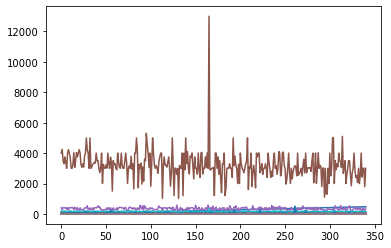

In [32]:
plt.plot(train_new)
plt.show()

In [33]:
#pd.set_option('display.height',1000)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',100)
pd.set_option('display.width',1000)
train_new.head()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating
0,0,6.26,4,80.68,403,4000,1.8,157.9,20,182,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.5
1,1,6.20,3,80.85,271,4230,1.8,156.2,8,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.5
2,2,6.30,3,83.68,409,3500,2.1,157.0,25,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.4
3,4,6.00,4,74.78,411,3300,2.2,159.8,24,169,64,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.3
4,5,6.50,4,84.23,396,3750,2.2,160.4,16,175,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.4


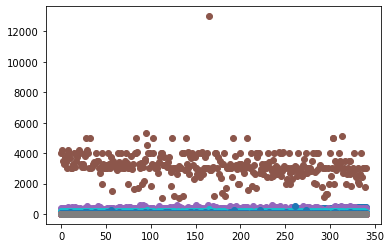

In [34]:
plt.plot(train_new,'o')
plt.show()

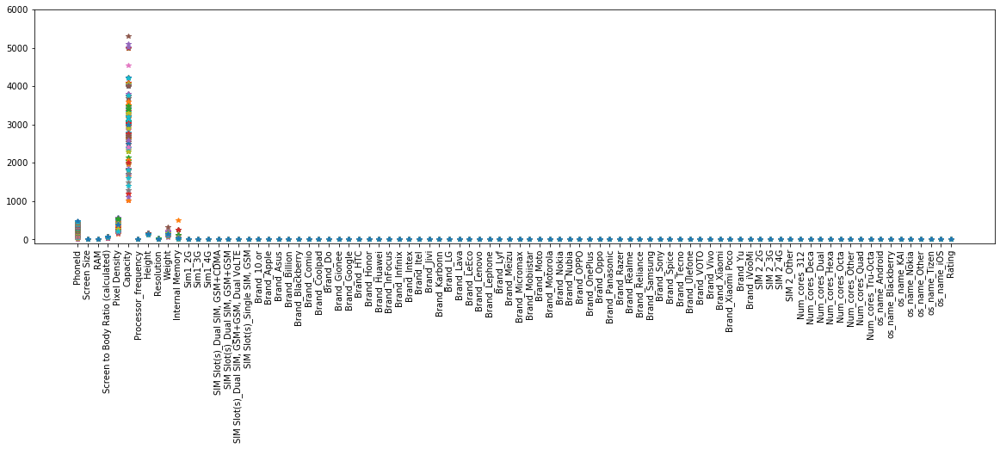

In [35]:
plt.figure(figsize=(20,5))
plt.plot(train_new.T,'*')
plt.ylim(-100,6000)
plt.xticks(rotation='vertical')
plt.show()

In [36]:
train_new['isLiked']=train_new['Rating'].map(lambda x: 0 if x<3.9 else 1)

In [37]:
print(train_new['isLiked'].value_counts())

1    267
0     74
Name: isLiked, dtype: int64


In [38]:
train_new.groupby('isLiked').mean()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating
isLiked,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,311.189189,5.107432,2.513514,68.329054,325.513514,2914.121622,1.551351,146.025383,6.932432,157.445946,26.162162,0.013514,0.054054,0.932432,0.000000,0.945946,0.000000,0.054054,0.027027,0.000000,0.013514,0.0,0.040541,0.000000,0.013514,0.0,0.040541,0.000000,0.054054,0.00000,0.000000,0.027027,0.013514,0.040541,0.013514,0.013514,0.027027,0.054054,0.027027,0.000000,0.067568,0.013514,0.013514,0.000000,0.121622,0.027027,0.040541,0.000000,0.067568,0.013514,0.000000,0.000000,0.013514,0.027027,0.013514,0.000000,0.000000,0.054054,0.054054,0.0,0.000000,0.000000,0.013514,0.013514,0.000000,0.000000,0.027027,0.013514,0.364865,0.013514,0.567568,0.054054,0.000000,0.027027,0.040541,0.013514,0.378378,0.013514,0.527027,0.000000,0.932432,0.013514,0.013514,0.000000,0.027027,0.013514,0.000000,3.510811
1,211.292135,5.560674,3.438202,73.468689,349.393258,3268.131086,1.859401,151.033116,10.329588,162.423221,51.970037,0.022472,0.011236,0.966292,0.003745,0.707865,0.194757,0.093633,0.000000,0.071161,0.026217,0.0,0.007491,0.003745,0.003745,0.0,0.026217,0.014981,0.007491,0.06367,0.022472,0.003745,0.007491,0.003745,0.011236,0.000000,0.000000,0.018727,0.014981,0.003745,0.037453,0.000000,0.000000,0.007491,0.022472,0.007491,0.044944,0.007491,0.059925,0.000000,0.052434,0.011236,0.018727,0.007491,0.000000,0.014981,0.003745,0.149813,0.018727,0.0,0.029963,0.003745,0.000000,0.093633,0.078652,0.011236,0.007491,0.000000,0.168539,0.022472,0.715356,0.093633,0.003745,0.000000,0.026217,0.041199,0.636704,0.018727,0.269663,0.003745,0.898876,0.003745,0.003745,0.003745,0.018727,0.000000,0.071161,4.228090


In [39]:
X_train=train_new.drop('isLiked',axis=1)
X_train=X_train.drop('Rating',axis =1)

In [40]:
X_train.head()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS
0,0,6.26,4,80.68,403,4000,1.8,157.9,20,182,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
1,1,6.20,3,80.85,271,4230,1.8,156.2,8,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
2,2,6.30,3,83.68,409,3500,2.1,157.0,25,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
3,4,6.00,4,74.78,411,3300,2.2,159.8,24,169,64,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,5,6.50,4,84.23,396,3750,2.2,160.4,16,175,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0


In [41]:
Y_train = train_new['isLiked']

In [42]:
print(X_train.shape)
print(Y_train.shape)

(341, 87)
(341,)


In [43]:
test_new.columns

Index(['PhoneId', 'Screen Size', 'RAM', 'Screen to Body Ratio (calculated)', 'Pixel Density', 'Capacity', 'Processor_frequency', 'Height', 'Resolution', 'Weight', 'Internal Memory', 'Sim1_2G', 'Sim1_3G', 'Sim1_4G', 'SIM Slot(s)_Dual SIM, GSM+CDMA', 'SIM Slot(s)_Dual SIM, GSM+GSM', 'SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE', 'SIM Slot(s)_Single SIM, GSM', 'Brand_10.or', 'Brand_Apple', 'Brand_Asus', 'Brand_Billion', 'Brand_Blackberry', 'Brand_Comio', 'Brand_Coolpad', 'Brand_Do', 'Brand_Gionee', 'Brand_Google', 'Brand_HTC', 'Brand_Honor', 'Brand_Huawei', 'Brand_InFocus', 'Brand_Infinix', 'Brand_Intex', 'Brand_Itel', 'Brand_Jivi', 'Brand_Karbonn', 'Brand_LG', 'Brand_Lava', 'Brand_LeEco', 'Brand_Lenovo', 'Brand_Lephone', 'Brand_Lyf', 'Brand_Meizu', 'Brand_Micromax', 'Brand_Mobiistar', 'Brand_Moto', 'Brand_Motorola', 'Brand_Nokia', 'Brand_Nubia', 'Brand_OPPO', 'Brand_OnePlus', 'Brand_Oppo', 'Brand_Panasonic', 'Brand_Razer', 'Brand_Realme', 'Brand_Reliance', 'Brand_Samsung', 'Brand_Sony',
  

In [44]:
X_test = test_new.copy()

In [45]:
import matplotlib.pyplot as plt 
import seaborn as sns 
sns.set()

In [46]:
X_binarised_train = X_train.drop('PhoneId',axis=1)

In [47]:
train_new.groupby('isLiked').mean()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating
isLiked,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,311.189189,5.107432,2.513514,68.329054,325.513514,2914.121622,1.551351,146.025383,6.932432,157.445946,26.162162,0.013514,0.054054,0.932432,0.000000,0.945946,0.000000,0.054054,0.027027,0.000000,0.013514,0.0,0.040541,0.000000,0.013514,0.0,0.040541,0.000000,0.054054,0.00000,0.000000,0.027027,0.013514,0.040541,0.013514,0.013514,0.027027,0.054054,0.027027,0.000000,0.067568,0.013514,0.013514,0.000000,0.121622,0.027027,0.040541,0.000000,0.067568,0.013514,0.000000,0.000000,0.013514,0.027027,0.013514,0.000000,0.000000,0.054054,0.054054,0.0,0.000000,0.000000,0.013514,0.013514,0.000000,0.000000,0.027027,0.013514,0.364865,0.013514,0.567568,0.054054,0.000000,0.027027,0.040541,0.013514,0.378378,0.013514,0.527027,0.000000,0.932432,0.013514,0.013514,0.000000,0.027027,0.013514,0.000000,3.510811
1,211.292135,5.560674,3.438202,73.468689,349.393258,3268.131086,1.859401,151.033116,10.329588,162.423221,51.970037,0.022472,0.011236,0.966292,0.003745,0.707865,0.194757,0.093633,0.000000,0.071161,0.026217,0.0,0.007491,0.003745,0.003745,0.0,0.026217,0.014981,0.007491,0.06367,0.022472,0.003745,0.007491,0.003745,0.011236,0.000000,0.000000,0.018727,0.014981,0.003745,0.037453,0.000000,0.000000,0.007491,0.022472,0.007491,0.044944,0.007491,0.059925,0.000000,0.052434,0.011236,0.018727,0.007491,0.000000,0.014981,0.003745,0.149813,0.018727,0.0,0.029963,0.003745,0.000000,0.093633,0.078652,0.011236,0.007491,0.000000,0.168539,0.022472,0.715356,0.093633,0.003745,0.000000,0.026217,0.041199,0.636704,0.018727,0.269663,0.003745,0.898876,0.003745,0.003745,0.003745,0.018727,0.000000,0.071161,4.228090


In [48]:
train_new.head()

,PhoneId,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,Rating,isLiked
0,0,6.26,4,80.68,403,4000,1.8,157.9,20,182,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.5,1
1,1,6.20,3,80.85,271,4230,1.8,156.2,8,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.5,1
2,2,6.30,3,83.68,409,3500,2.1,157.0,25,168,32,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.4,1
3,4,6.00,4,74.78,411,3300,2.2,159.8,24,169,64,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.3,1
4,5,6.50,4,84.23,396,3750,2.2,160.4,16,175,64,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,4.4,1


In [49]:
X_binarised_train['Screen to Body Ratio (calculated)']=X_train['Screen to Body Ratio (calculated)'].map(lambda x: 0 if x<X_train['Screen to Body Ratio (calculated)'].mean() else 1)
X_binarised_train['Capacity']=X_train['Capacity'].map(lambda x: 0 if x<X_train['Capacity'].mean() else 1)
X_binarised_train['Pixel Density']=X_train['Pixel Density'].map(lambda x: 0 if x<X_train['Pixel Density'].mean() else 1)
X_binarised_train['Height']=X_train['Height'].map(lambda x: 0 if x<X_train['Height'].mean() else 1)
X_binarised_train['Processor_frequency']=X_train['Processor_frequency'].map(lambda x: 0 if x<X_train['Processor_frequency'].mean() else 1)

In [50]:
X_binarised_train['RAM']=X_train['RAM'].map(lambda x: 0 if x<X_train['RAM'].mean() else 1)
X_binarised_train['Internal Memory']=X_train['Internal Memory'].map(lambda x: 0 if x<X_train['Internal Memory'].mean() else 1)
X_binarised_train['Resolution']=X_train['Resolution'].map(lambda x: 0 if x<X_train['Resolution'].mean() else 1)
X_binarised_train['Weight']=X_train['Weight'].map(lambda x: 0 if x<X_train['Weight'].mean() else 1)
X_binarised_train['Screen Size']=X_train['Screen Size'].map(lambda x: 0 if x<X_train['Screen Size'].mean() else 1)

In [51]:
X_binarised_train.head()

,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS
0,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
1,1,0,1,0,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
2,1,0,1,1,1,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
3,1,1,1,1,1,1,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0


In [52]:
print(X_binarised_train.shape)
print(X_test.shape)

(341, 86)
(119, 87)


In [53]:
Train_PhoneId = train_new['PhoneId']
Test_PhoneId = X_test['PhoneId']
print(X_binarised_train.shape)
print(X_test.shape)

(341, 86)
(119, 87)


In [54]:
X_test.columns

Index(['PhoneId', 'Screen Size', 'RAM', 'Screen to Body Ratio (calculated)', 'Pixel Density', 'Capacity', 'Processor_frequency', 'Height', 'Resolution', 'Weight', 'Internal Memory', 'Sim1_2G', 'Sim1_3G', 'Sim1_4G', 'SIM Slot(s)_Dual SIM, GSM+CDMA', 'SIM Slot(s)_Dual SIM, GSM+GSM', 'SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE', 'SIM Slot(s)_Single SIM, GSM', 'Brand_10.or', 'Brand_Apple', 'Brand_Asus', 'Brand_Billion', 'Brand_Blackberry', 'Brand_Comio', 'Brand_Coolpad', 'Brand_Do', 'Brand_Gionee', 'Brand_Google', 'Brand_HTC', 'Brand_Honor', 'Brand_Huawei', 'Brand_InFocus', 'Brand_Infinix', 'Brand_Intex', 'Brand_Itel', 'Brand_Jivi', 'Brand_Karbonn', 'Brand_LG', 'Brand_Lava', 'Brand_LeEco', 'Brand_Lenovo', 'Brand_Lephone', 'Brand_Lyf', 'Brand_Meizu', 'Brand_Micromax', 'Brand_Mobiistar', 'Brand_Moto', 'Brand_Motorola', 'Brand_Nokia', 'Brand_Nubia', 'Brand_OPPO', 'Brand_OnePlus', 'Brand_Oppo', 'Brand_Panasonic', 'Brand_Razer', 'Brand_Realme', 'Brand_Reliance', 'Brand_Samsung', 'Brand_Sony',
  

Now time for binarsitaion of Test data

In [55]:
X_binarised_test=X_test.drop('PhoneId',axis=1)

In [56]:
X_binarised_test['Screen to Body Ratio (calculated)']=X_test['Screen to Body Ratio (calculated)'].map(lambda x: 0 if x<X_train['Screen to Body Ratio (calculated)'].mean() else 1)
X_binarised_test['Capacity']=X_test['Capacity'].map(lambda x: 0 if x<X_train['Capacity'].mean() else 1)
X_binarised_test['Pixel Density']=X_test['Pixel Density'].map(lambda x: 0 if x<X_train['Pixel Density'].mean() else 1)
X_binarised_test['Height']=X_test['Height'].map(lambda x: 0 if x<X_train['Height'].mean() else 1)
X_binarised_test['Processor_frequency']=X_test['Processor_frequency'].map(lambda x: 0 if x<X_train['Processor_frequency'].mean() else 1)
X_binarised_test['RAM']=X_test['RAM'].map(lambda x: 0 if x<X_train['RAM'].mean() else 1)
X_binarised_test['Internal Memory']=X_test['Internal Memory'].map(lambda x: 0 if x<X_train['Internal Memory'].mean() else 1)
X_binarised_test['Resolution']=X_test['Resolution'].map(lambda x: 0 if x<X_train['Resolution'].mean() else 1)
X_binarised_test['Weight']=X_test['Weight'].map(lambda x: 0 if x<X_train['Weight'].mean() else 1)
X_binarised_test['Screen Size']=X_test['Screen Size'].map(lambda x: 0 if x<X_train['Screen Size'].mean() else 1)

In [57]:
X_binarised_test.head()

,Screen Size,RAM,Screen to Body Ratio (calculated),Pixel Density,Capacity,Processor_frequency,Height,Resolution,Weight,Internal Memory,Sim1_2G,Sim1_3G,Sim1_4G,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS
0,1,0,1,0,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
3,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
4,1,1,1,1,1,1,1,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0


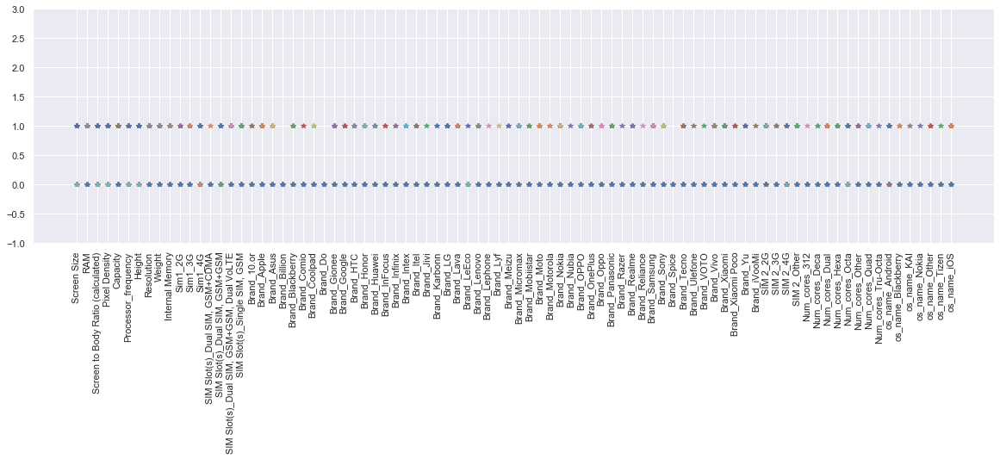

In [58]:
plt.figure(figsize=(20,5))
plt.plot(X_binarised_train.T,'*')
plt.ylim(-1,3)
plt.xticks(rotation='vertical')
plt.show()

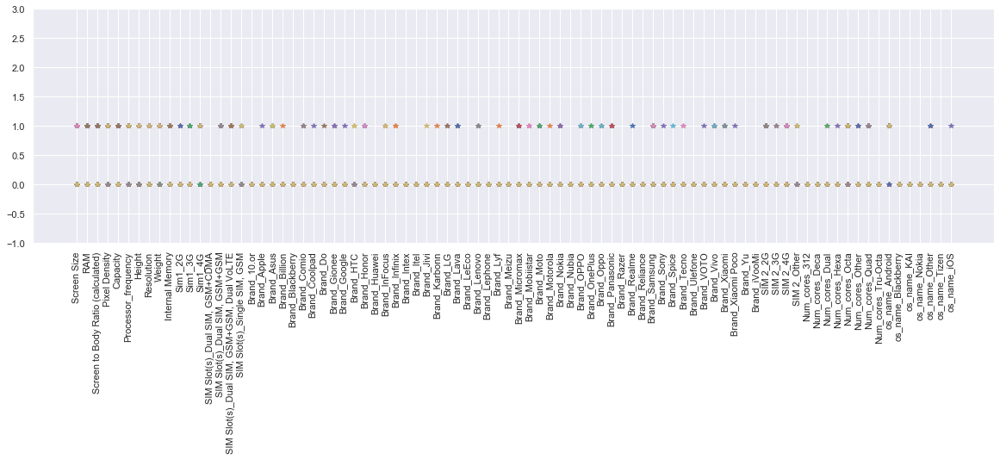

In [59]:
plt.figure(figsize=(20,5))
plt.plot(X_binarised_test.T,'*')
plt.ylim(-1,3)
plt.xticks(rotation='vertical')
plt.show()

In [60]:
X_binarised_train =X_binarised_train.values

In [61]:
X_binarised_test =X_binarised_test.values

In [62]:
Y_train =Y_train.values

Data Ready to apply algorithm

# MP Neuron Class

In [74]:
class MPNeuron:
    def __init__(self):
        self.b = None

    def model(self, x):
        return 1 if (sum(x) >= self.b) else 0

    def predict(self, X):
        Y = []
        for x in X:
            result = self.model(x)
            Y.append(result)
        return np.array(Y)

    def fit(self, X, Y):
        accuracy = {}
        accuracy_s=[]
        
        for b in range(X.shape[1] + 1):
            self.b = b
            Y_pred = self.predict(X)
            accuracy[b] = accuracy_score(Y_pred, Y)
            accuracy_s.append(accuracy_score(Y_pred, Y))

        best_b = max(accuracy, key=accuracy.get)
        self.b = best_b
        plt.plot(range(0,X.shape[1]+1),accuracy_s)
        plt.show()
        print('Optimal value of b is', best_b)
        print('Highest accuracy is', accuracy[best_b])

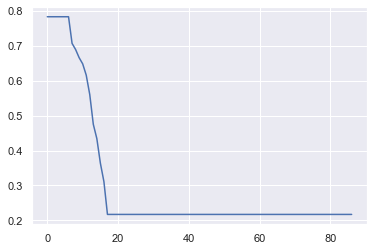

Optimal value of b is 0
Highest accuracy is 0.782991202346041


In [75]:
mp_neuron = MPNeuron()
mp_neuron.fit(X_binarised_train, Y_train)
Y_pred = mp_neuron.predict(X_binarised_train)

In [76]:
for x, y in zip(X_train['PhoneId'],Y_pred):
    print("PhoneID: {} {}".format(x,y))

PhoneID: 0 1
PhoneID: 1 1
PhoneID: 2 1
PhoneID: 4 1
PhoneID: 5 1
PhoneID: 7 1
PhoneID: 8 1
PhoneID: 9 1
PhoneID: 10 1
PhoneID: 12 1
PhoneID: 14 1
PhoneID: 15 1
PhoneID: 17 1
PhoneID: 18 1
PhoneID: 20 1
PhoneID: 21 1
PhoneID: 22 1
PhoneID: 23 1
PhoneID: 26 1
PhoneID: 28 1
PhoneID: 30 1
PhoneID: 31 1
PhoneID: 33 1
PhoneID: 34 1
PhoneID: 36 1
PhoneID: 37 1
PhoneID: 38 1
PhoneID: 42 1
PhoneID: 44 1
PhoneID: 45 1
PhoneID: 47 1
PhoneID: 48 1
PhoneID: 49 1
PhoneID: 50 1
PhoneID: 51 1
PhoneID: 52 1
PhoneID: 53 1
PhoneID: 54 1
PhoneID: 55 1
PhoneID: 56 1
PhoneID: 57 1
PhoneID: 58 1
PhoneID: 59 1
PhoneID: 60 1
PhoneID: 61 1
PhoneID: 62 1
PhoneID: 63 1
PhoneID: 64 1
PhoneID: 65 1
PhoneID: 66 1
PhoneID: 67 1
PhoneID: 68 1
PhoneID: 69 1
PhoneID: 70 1
PhoneID: 72 1
PhoneID: 73 1
PhoneID: 74 1
PhoneID: 75 1
PhoneID: 76 1
PhoneID: 77 1
PhoneID: 79 1
PhoneID: 80 1
PhoneID: 81 1
PhoneID: 83 1
PhoneID: 85 1
PhoneID: 86 1
PhoneID: 87 1
PhoneID: 89 1
PhoneID: 90 1
PhoneID: 91 1
PhoneID: 93 1
PhoneID: 94 1


In [77]:
Y_pred2 = mp_neuron.predict(X_binarised_test)

In [78]:
submission = pd.DataFrame({'PhoneId':X_test['PhoneId'], 'Class':Y_pred2})
submission = submission[['PhoneId', 'Class']]
submission.describe()

,PhoneId,Class
count,119.000000,119.0
mean,240.176471,1.0
std,136.804614,0.0
min,3.000000,1.0
25%,130.000000,1.0
50%,245.000000,1.0
75%,348.500000,1.0
max,473.000000,1.0


In [79]:
submission.to_csv("submission2.csv", index=False)